<h2 style="color:darkorange">HR ANALYTICS ATTRITION CLASSIFICATION MACHINE LEARNING MODEL</h2>

<H4>Importing necessary libraries</H4>

In [1]:
import numpy as np
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import seaborn as sns

<h4>Importing the dataset using pandas read_csv library</h4>

In [4]:
df = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [5]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


<h3>EXPLORATORY DATA ANALYSIS</h3>

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [8]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [9]:
df.iloc[0]

Age                                      41
Attrition                               Yes
BusinessTravel                Travel_Rarely
DailyRate                              1102
Department                            Sales
DistanceFromHome                          1
Education                                 2
EducationField                Life Sciences
EmployeeCount                             1
EmployeeNumber                            1
EnvironmentSatisfaction                   2
Gender                               Female
HourlyRate                               94
JobInvolvement                            3
JobLevel                                  2
JobRole                     Sales Executive
JobSatisfaction                           4
MaritalStatus                        Single
MonthlyIncome                          5993
MonthlyRate                           19479
NumCompaniesWorked                        8
Over18                                    Y
OverTime                        

In [10]:
for x in df.columns:
    if df[x].dtype!='int':
        print(x,'-' ,df[x].dtype)

Attrition - object
BusinessTravel - object
Department - object
EducationField - object
Gender - object
JobRole - object
MaritalStatus - object
Over18 - object
OverTime - object


In [11]:
#Above are some categorical columns which we will convert to numerical using one hot encoding

<H3>DATA VISUALIZATION</H3>

<Axes: xlabel='Attrition', ylabel='count'>

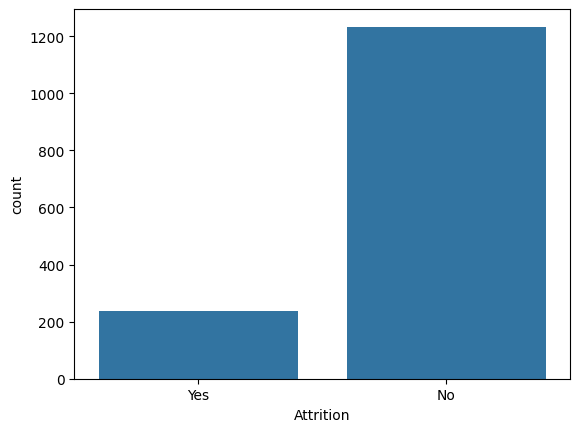

In [12]:
sns.countplot(data=df, x='Attrition')


In [13]:
#DATASET IS IMBALANCED 

<Axes: xlabel='Age', ylabel='DailyRate'>

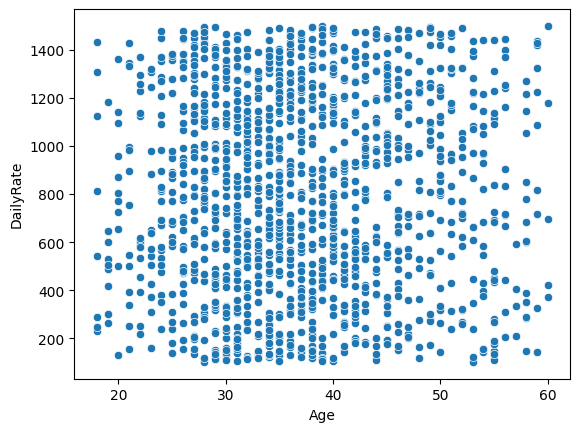

In [14]:
sns.scatterplot(data=df, x='Age', y='DailyRate')

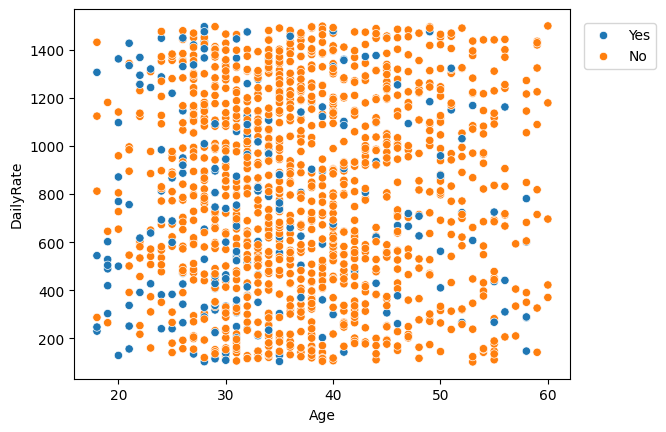

In [15]:
sns.scatterplot(data=df, x='Age', y='DailyRate', hue='Attrition')
plt.legend(loc='center', bbox_to_anchor=(1.1,0.9))

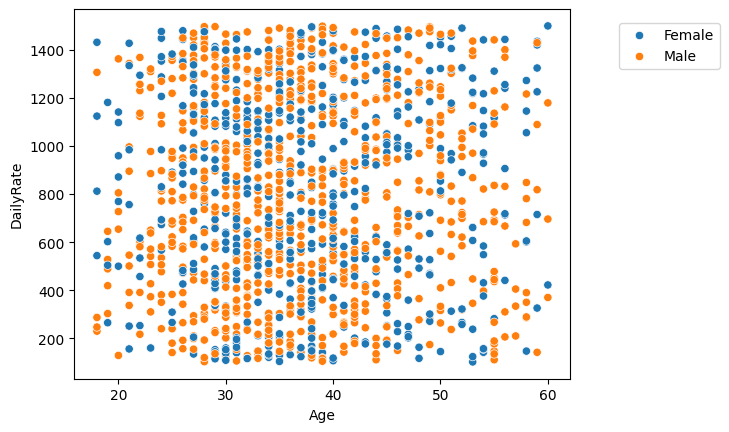

In [16]:
sns.scatterplot(data=df, x='Age', y='DailyRate', hue='Gender')
plt.legend(loc='center', bbox_to_anchor=(1.2,0.9))

<Axes: xlabel='DailyRate', ylabel='Count'>

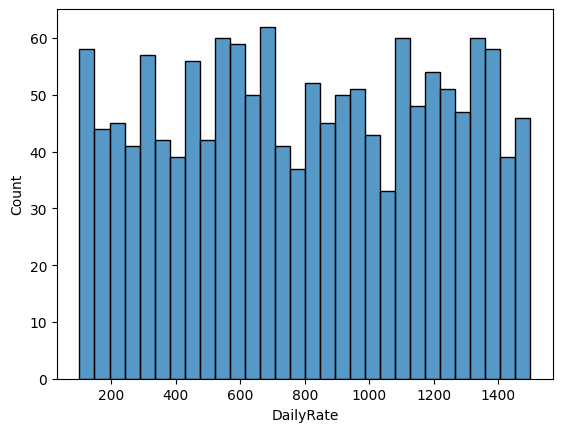

In [17]:
sns.histplot(data=df, x='DailyRate', bins=30)

<Axes: xlabel='DailyRate', ylabel='Density'>

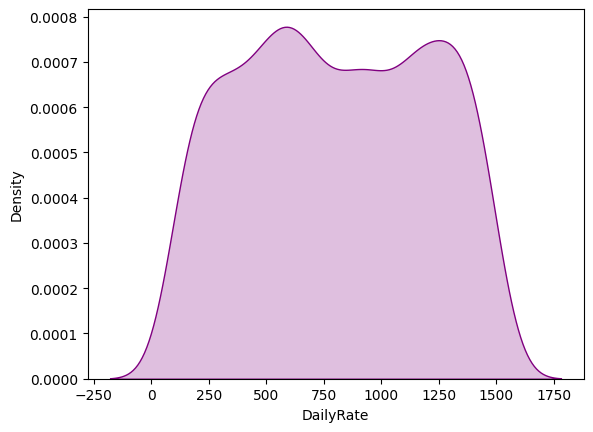

In [18]:
sns.kdeplot(data=df, x='DailyRate', fill=True, color='purple')

<Axes: xlabel='DailyRate', ylabel='Count'>

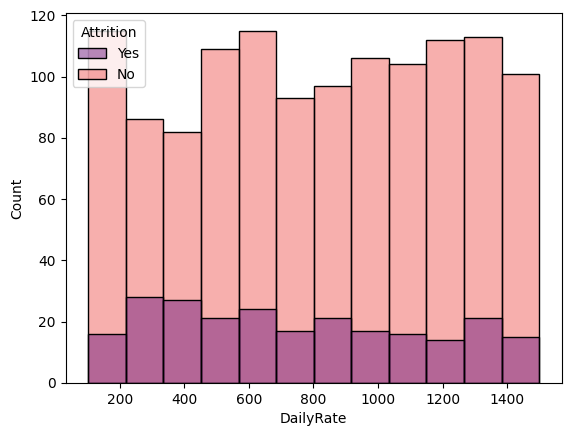

In [19]:
sns.histplot(data=df, x='DailyRate', hue='Attrition', palette='magma')


<Axes: xlabel='DailyRate', ylabel='Density'>

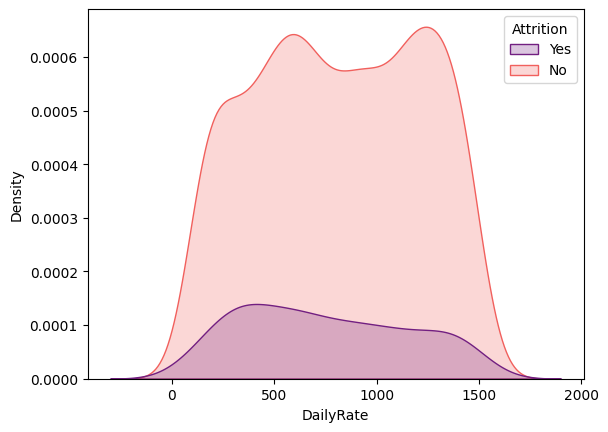

In [20]:
sns.kdeplot(data=df, x='DailyRate', hue='Attrition', fill=True, palette='magma')

<Axes: xlabel='BusinessTravel', ylabel='count'>

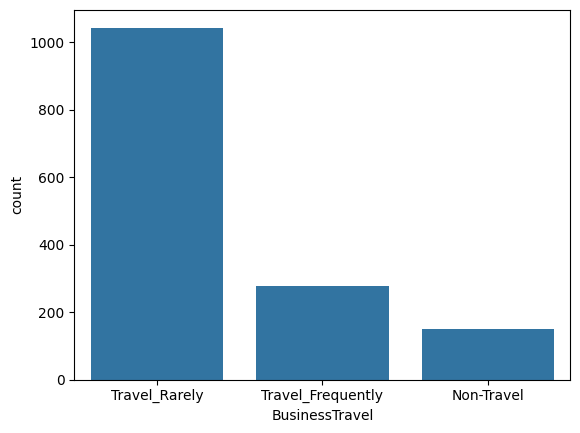

In [21]:
sns.countplot(data=df, x='BusinessTravel')

<Axes: xlabel='BusinessTravel', ylabel='Count'>

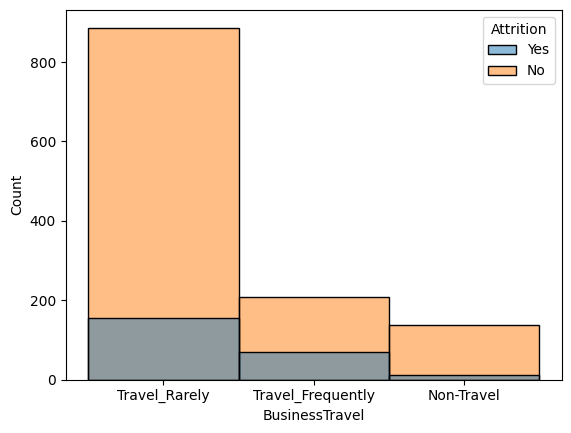

In [22]:
sns.histplot(data=df, x='BusinessTravel', hue='Attrition',)

<h4>We cannot say that people who travel frequently for business purpose want to leave the company</h4>

<Axes: xlabel='BusinessTravel', ylabel='count'>

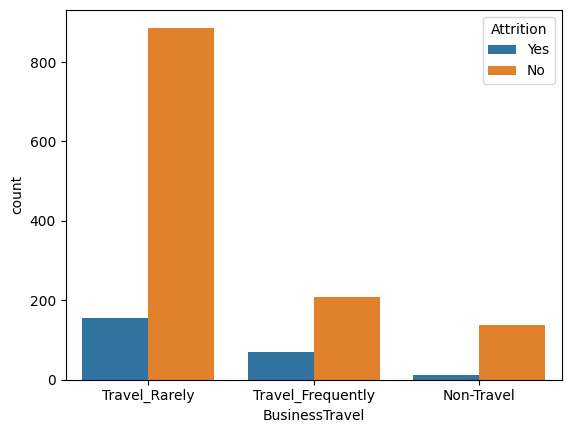

In [23]:
sns.countplot(data=df, x='BusinessTravel', hue='Attrition')

<Axes: xlabel='Attrition', ylabel='count'>

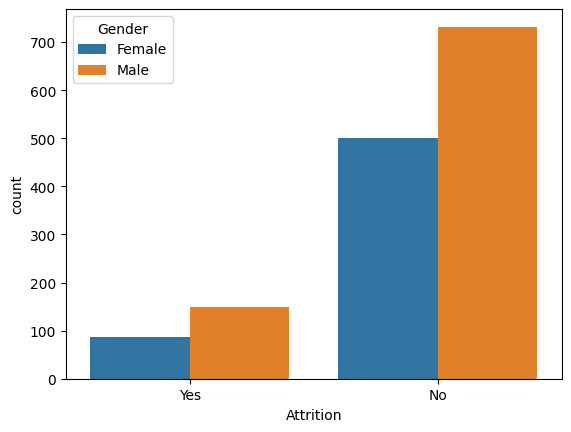

In [24]:
sns.countplot(data=df, x='Attrition', hue='Gender')

<h4>We can say that Gender does not play in role in attrition at all</h4>

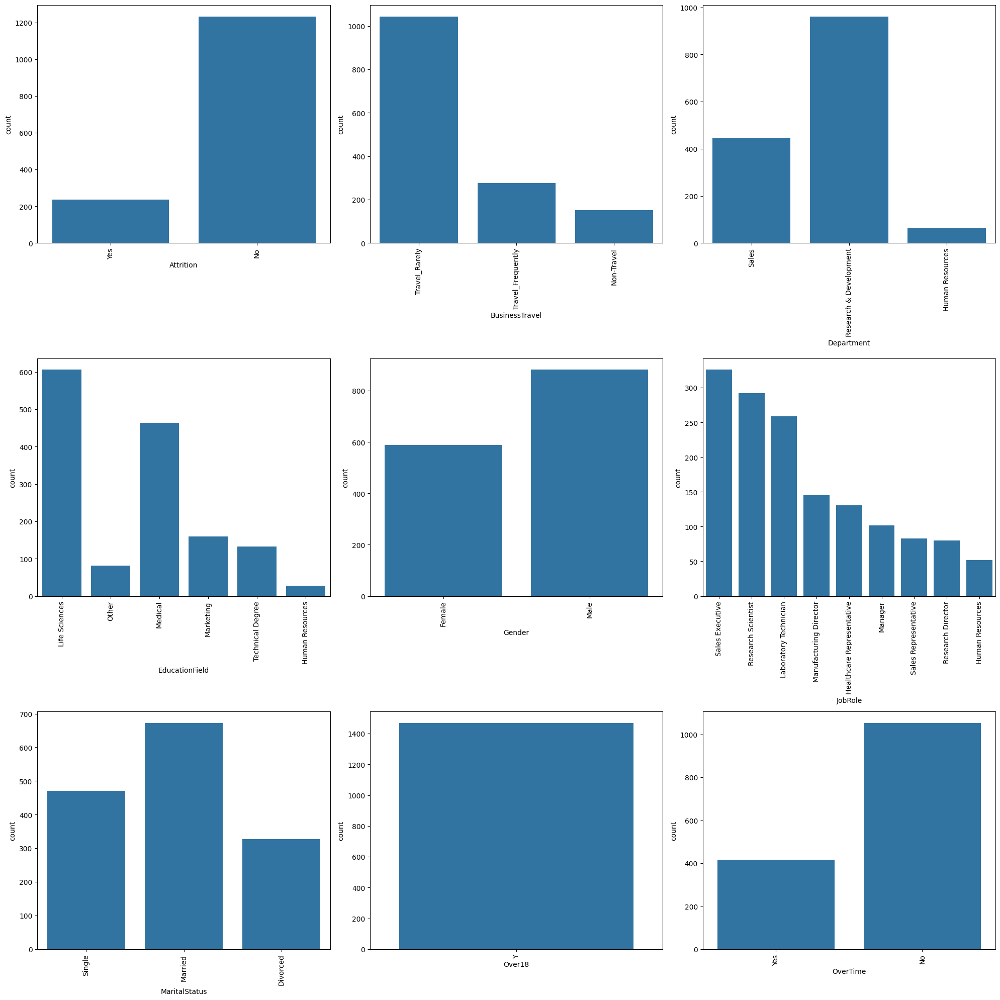

In [25]:
fig, axes = plt.subplots(3,3, figsize=(20,20))
plotnumber = 1
for x in df.columns:
    if df[x].dtype!='int':
        ax = plt.subplot(3,3,plotnumber)
        sns.countplot(data=df, x=x)
        plt.xticks(rotation=90)
        plotnumber = plotnumber + 1
plt.tight_layout()

In [26]:
#ALL EMPLOYEES ARE OVER 18 MEANS ADULT SO WE CA JUST DROP THE COLUMN AS IT WILL NOT HAVE A EFFECT ON ATTRITION

<Axes: xlabel='MaritalStatus', ylabel='count'>

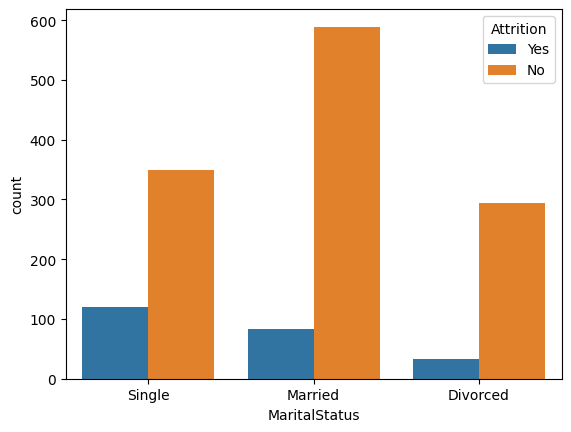

In [27]:
sns.countplot(data=df, x='MaritalStatus', hue='Attrition')

([0, 1, 2, 3, 4, 5, 6, 7, 8],
 [Text(0, 0, 'Sales Executive'),
  Text(1, 0, 'Research Scientist'),
  Text(2, 0, 'Laboratory Technician'),
  Text(3, 0, 'Manufacturing Director'),
  Text(4, 0, 'Healthcare Representative'),
  Text(5, 0, 'Manager'),
  Text(6, 0, 'Sales Representative'),
  Text(7, 0, 'Research Director'),
  Text(8, 0, 'Human Resources')])

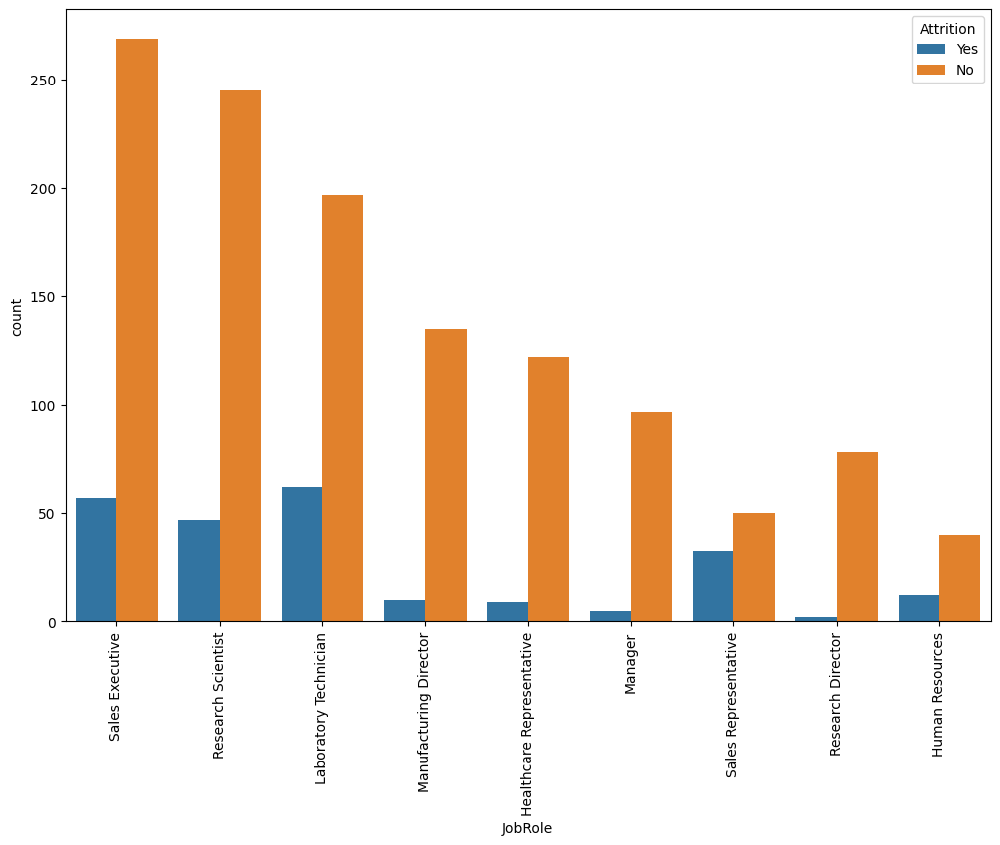

In [28]:
plt.figure(figsize=(12,8))
sns.countplot(data=df, x='JobRole', hue='Attrition')
plt.xticks(rotation=90)


<h3>Sales Representative have a higher chance of leaving the company</h3>

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Life Sciences'),
  Text(1, 0, 'Other'),
  Text(2, 0, 'Medical'),
  Text(3, 0, 'Marketing'),
  Text(4, 0, 'Technical Degree'),
  Text(5, 0, 'Human Resources')])

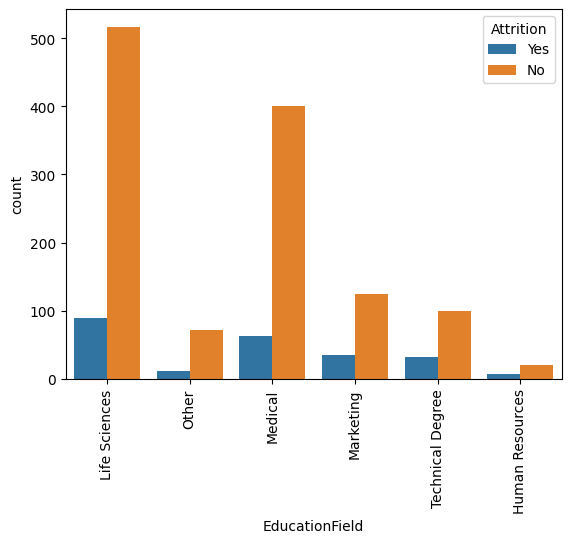

In [29]:
sns.countplot(data=df, x='EducationField',hue='Attrition')
plt.xticks(rotation=90)

<Axes: xlabel='Department', ylabel='count'>

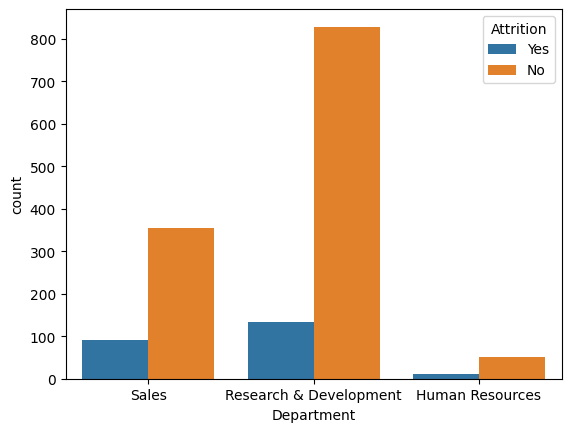

In [30]:
sns.countplot(data=df, x='Department', hue='Attrition')

In [31]:
#CHECK DUPLICATES

In [32]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1465    False
1466    False
1467    False
1468    False
1469    False
Length: 1470, dtype: bool

In [33]:
df.duplicated().value_counts()

False    1470
Name: count, dtype: int64

<h3>We have found there are no duplicated values in the dataset</h3>

In [34]:
df.drop_duplicates(inplace=True)

In [35]:
#Check null values

In [36]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [37]:
#There are no null values present in our dataset

In [38]:
import warnings
warnings.filterwarnings(action='ignore')

<Axes: xlabel='Age', ylabel='Density'>

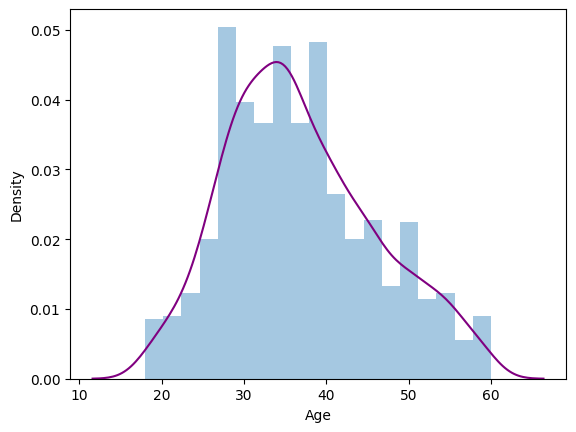

In [39]:
sns.distplot(a=df['Age'],kde_kws={'color':'purple'})

<Axes: xlabel='HourlyRate', ylabel='Density'>

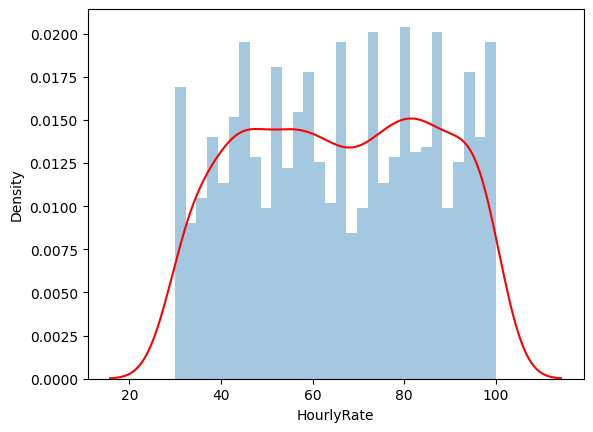

In [40]:
sns.distplot(a=df['HourlyRate'], bins=30, kde_kws={'color':'red'})

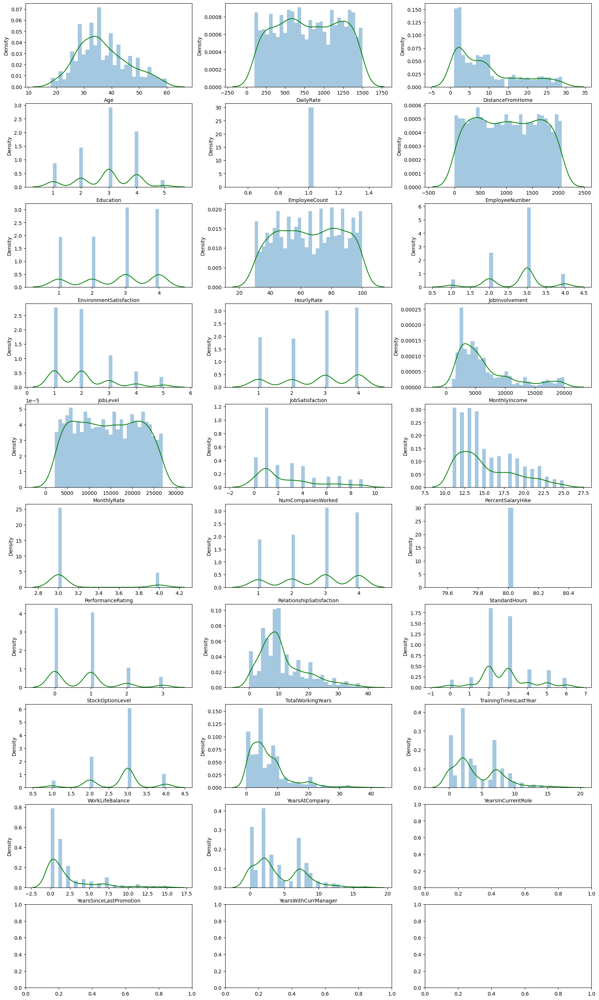

In [41]:
fig, axes = plt.subplots(10,3,figsize=(20,35))
plotnumber = 1
for x in df.columns:
    ax = plt.subplot(10,3,plotnumber)
    if df[x].dtype=='int':
        sns.distplot(a=df[x], bins=30, kde_kws={'color':'green'})
    else:
        continue
    plotnumber += 1

In [42]:
a = df.groupby(by='Department')['HourlyRate'].mean()
a

Department
Human Resources           64.301587
Research & Development    66.167534
Sales                     65.520179
Name: HourlyRate, dtype: float64

In [43]:
a = df.groupby(by='Department')['MonthlyIncome'].mean()
a

Department
Human Resources           6654.507937
Research & Development    6281.252862
Sales                     6959.172646
Name: MonthlyIncome, dtype: float64

<Axes: xlabel='Department'>

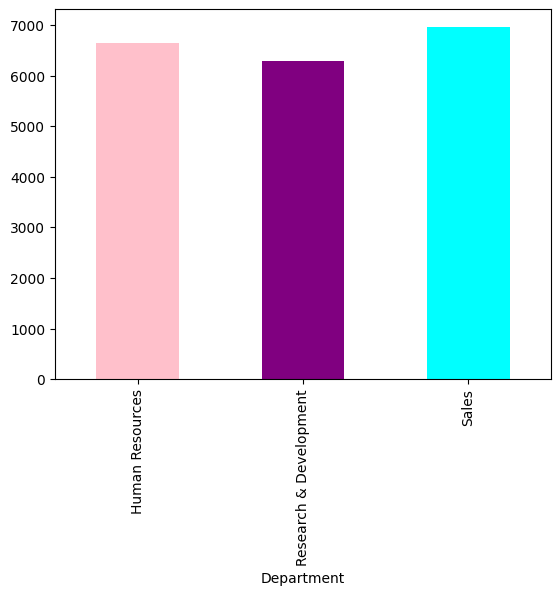

In [44]:
a.plot.bar(color=['pink', 'purple', 'cyan'])

<h3>All departments are paid equal salary</h3>

In [45]:
b=df.groupby(by='Education')['MonthlyIncome'].mean()
b

Education
1    5640.570588
2    6226.645390
3    6517.263986
4    6832.402010
5    8277.645833
Name: MonthlyIncome, dtype: float64

<Axes: xlabel='Education'>

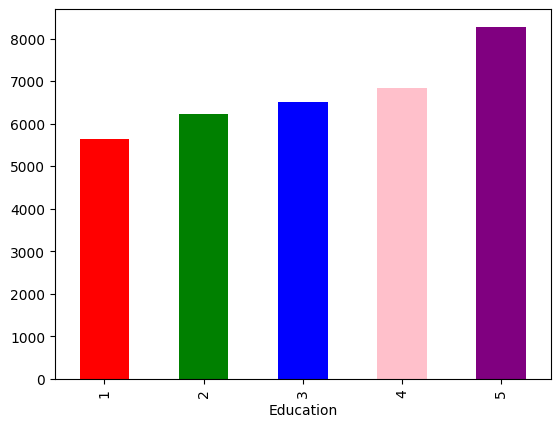

In [46]:
b.plot.bar(color=['red','green','blue','pink','purple'])

<h3>If you have a higher degree of education like 5 then you have better salary than other people with lower educational qualifications</h3>

In [47]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [48]:
c = df.groupby(by='JobRole')['MonthlyIncome'].mean()
c

JobRole
Healthcare Representative     7528.763359
Human Resources               4235.750000
Laboratory Technician         3237.169884
Manager                      17181.676471
Manufacturing Director        7295.137931
Research Director            16033.550000
Research Scientist            3239.972603
Sales Executive               6924.279141
Sales Representative          2626.000000
Name: MonthlyIncome, dtype: float64

<Axes: xlabel='JobRole'>

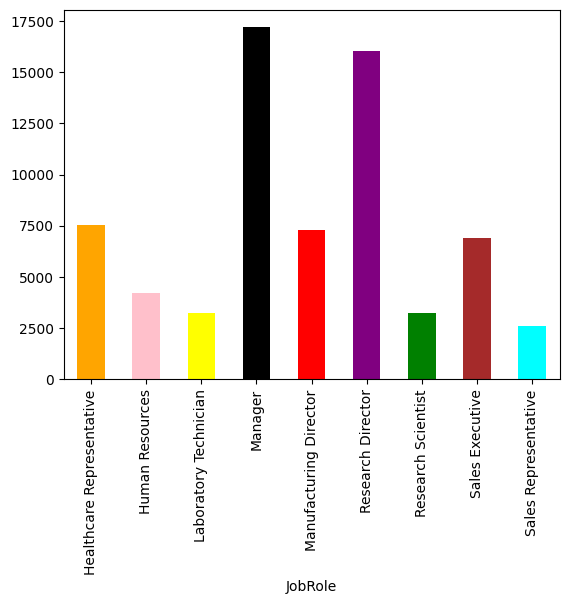

In [49]:
c.plot(kind='bar', color=['orange','pink','yellow','black','red','purple','green', 'brown','cyan'])

<h4>Manager and Research Director are one of the best paid jobs</h4>

In [50]:
d = df.groupby(by='EducationField')['MonthlyIncome'].mean()
d

EducationField
Human Resources     7241.148148
Life Sciences       6463.288779
Marketing           7348.584906
Medical             6510.036638
Other               6071.548780
Technical Degree    5758.303030
Name: MonthlyIncome, dtype: float64

<Axes: xlabel='EducationField'>

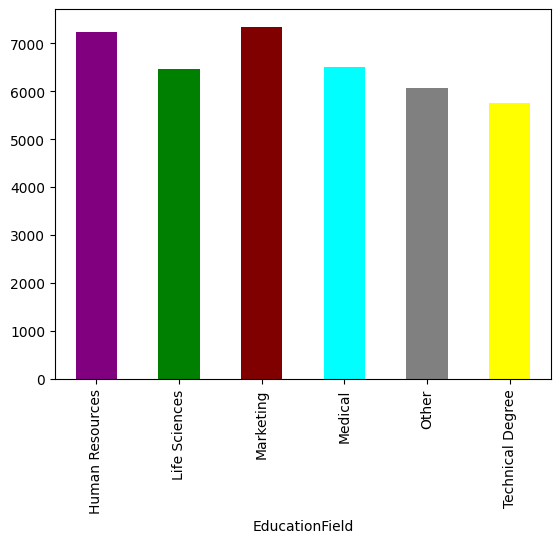

In [51]:
d.plot.bar(color=['purple','green', 'maroon','cyan', 'grey', 'yellow'])

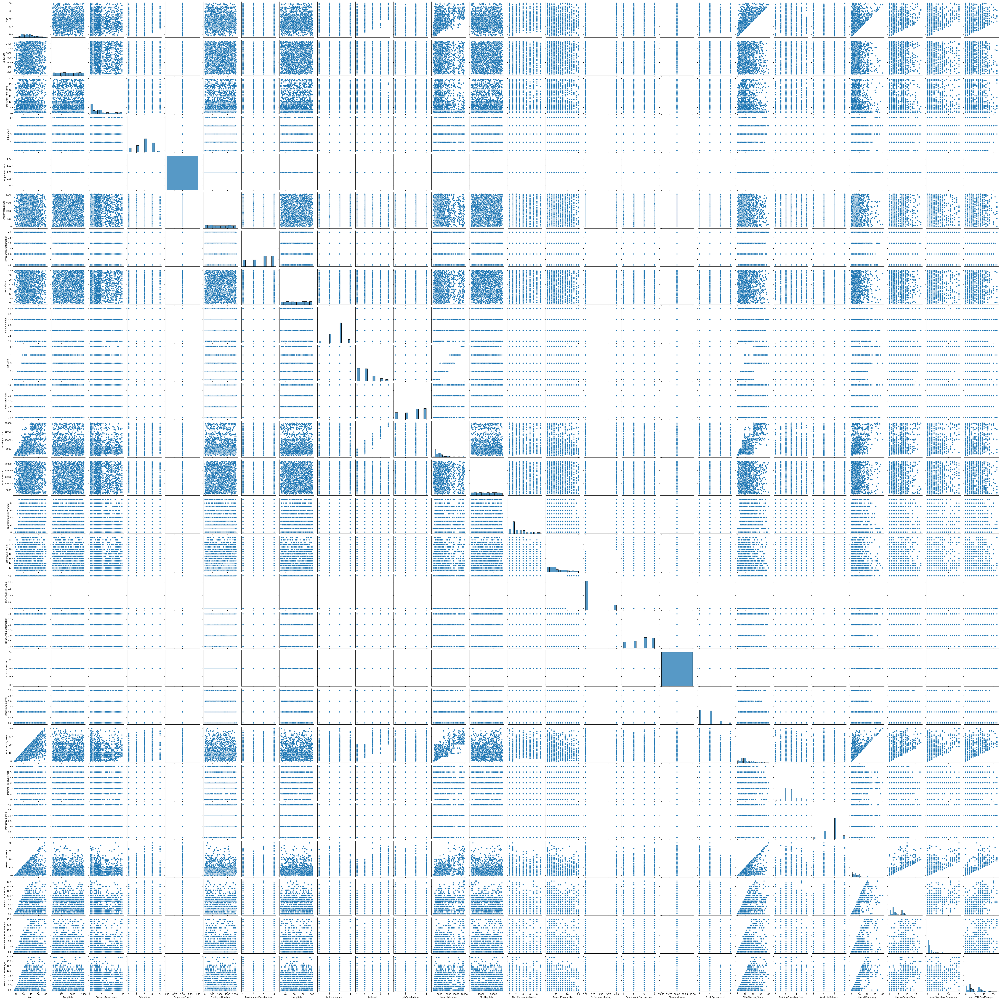

In [52]:
sns.pairplot(data=df)

In [53]:
#ABOVE IS THE PAIRPLOT

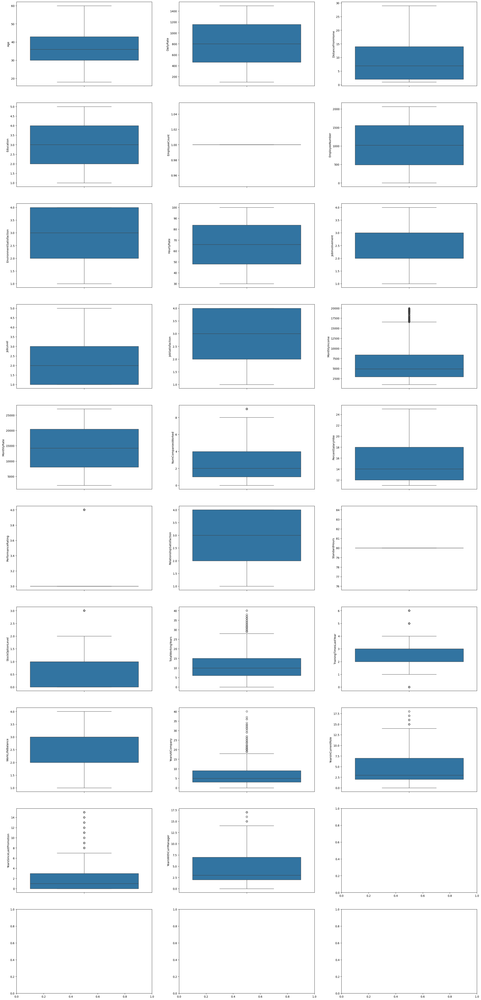

In [54]:
fig, axes = plt.subplots(10,3,figsize=(30,65))
plotnumber = 1
for x in df.columns:
    ax = plt.subplot(10,3,plotnumber)
    if df[x].dtype=='int':
        sns.boxplot(data=df, y=x)
    else:
        continue
    plotnumber += 1

<h4>There are outliers but we will not drop  them</h4>

In [55]:
non_int_df_columnlist=[]
for x in df.columns:
    if df[x].dtype!='int':
        non_int_df_columnlist.append(x)
non_int_df_columnlist

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

In [56]:
df['Attrition'] = df['Attrition'].map({'Yes':1, 'No':0})
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,0,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [57]:
#HEATMAP OF DATAFRAME

In [58]:
non_int_df_columnlist=[]
for x in df.columns:
    if df[x].dtype!='int':
        non_int_df_columnlist.append(x)
non_int_df_columnlist

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

In [59]:
num_df = df.drop(non_int_df_columnlist, axis=1)
num_df

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,1,2,1,1,2,94,3,...,1,80,0,8,0,1,6,4,0,5
1,49,0,279,8,1,1,2,3,61,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,1373,2,2,1,4,4,92,2,...,2,80,0,7,3,3,0,0,0,0
3,33,0,1392,3,4,1,5,4,56,3,...,3,80,0,8,3,3,8,7,3,0
4,27,0,591,2,1,1,7,1,40,3,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,23,2,1,2061,3,41,4,...,3,80,1,17,3,3,5,2,0,3
1466,39,0,613,6,1,1,2062,4,42,2,...,1,80,1,9,5,3,7,7,1,7
1467,27,0,155,4,3,1,2064,2,87,4,...,2,80,1,6,0,3,6,2,0,3
1468,49,0,1023,2,3,1,2065,4,63,2,...,4,80,0,17,3,2,9,6,0,8


In [60]:
num_df.corr()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,NaN,-0.010577,-0.103369,-0.006846,-0.130016,...,-0.045872,NaN,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.010577,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976


<Axes: >

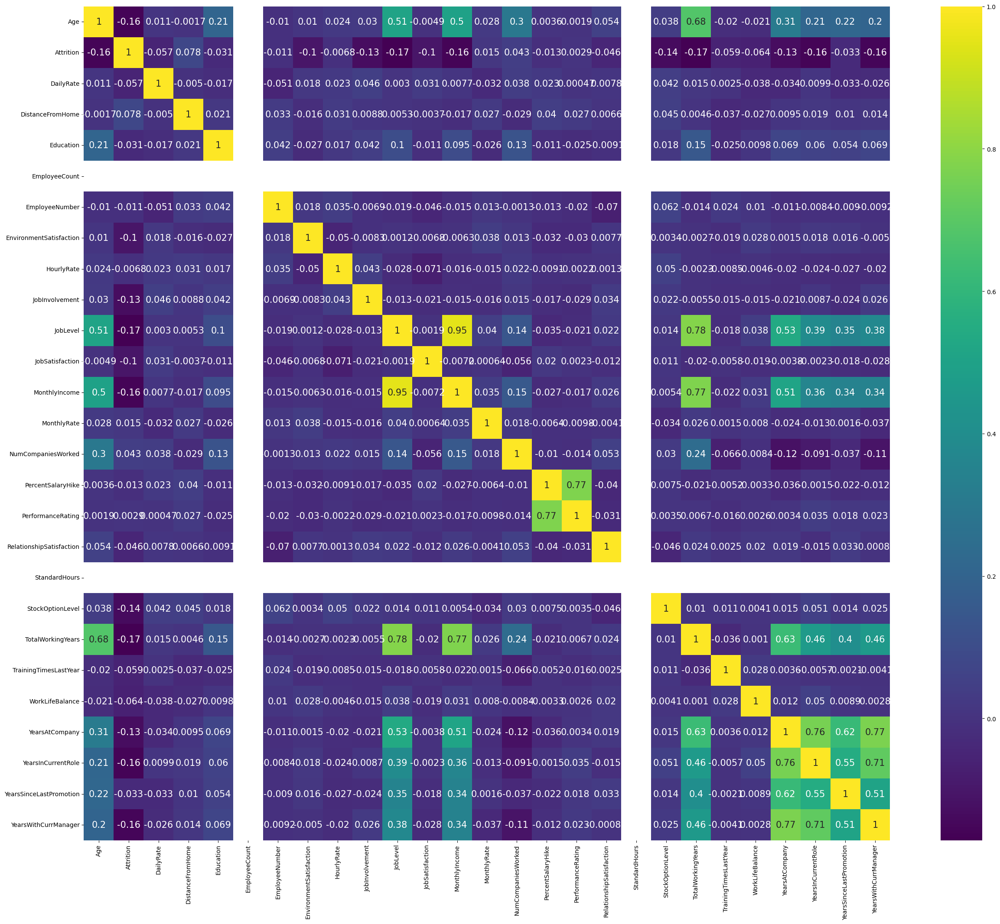

In [61]:
plt.figure(figsize=(30,25))
sns.heatmap(data=num_df.corr(), annot=True, fmt='0.2g',cmap='viridis', annot_kws={'size':15})

<h4>Attrition is not highly corelated to any particular column</h4>

<h3>FEATURE ENGINEERING</h3>

In [62]:
df['Over18'].value_counts()

Over18
Y    1470
Name: count, dtype: int64

In [63]:
df['OverTime'].value_counts()

OverTime
No     1054
Yes     416
Name: count, dtype: int64

In [64]:
#We will use one hot encoding technique

In [65]:
df = pd.get_dummies(data=df, columns=non_int_df_columnlist, dtype=int, drop_first=True)
df

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1102,1,2,1,1,2,94,3,...,0,0,0,0,0,1,0,0,1,1
1,49,0,279,8,1,1,2,3,61,2,...,0,0,0,0,1,0,0,1,0,0
2,37,1,1373,2,2,1,4,4,92,2,...,1,0,0,0,0,0,0,0,1,1
3,33,0,1392,3,4,1,5,4,56,3,...,0,0,0,0,1,0,0,1,0,1
4,27,0,591,2,1,1,7,1,40,3,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,23,2,1,2061,3,41,4,...,1,0,0,0,0,0,0,1,0,0
1466,39,0,613,6,1,1,2062,4,42,2,...,0,0,0,0,0,0,0,1,0,0
1467,27,0,155,4,3,1,2064,2,87,4,...,0,0,1,0,0,0,0,1,0,1
1468,49,0,1023,2,3,1,2065,4,63,2,...,0,0,0,0,0,1,0,1,0,0


<h3>Here, you will find out thet beacuse we have used drop first, the over 18 column gets dropped because
there is only one values 'Yes' and it will not have any effect on attrition</h3>

<h3>DATA PREPROCESSING</h3>

In [66]:
from sklearn.model_selection import train_test_split

In [67]:
X = df.drop('Attrition', axis=1)
y = df['Attrition']

In [68]:
X_original = X.copy()
X_original

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,1,1,2,94,3,2,...,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,1,2,3,61,2,2,...,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,1,4,4,92,2,1,...,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,1,5,4,56,3,1,...,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,7,1,40,3,1,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,...,1,0,0,0,0,0,0,1,0,0
1466,39,613,6,1,1,2062,4,42,2,3,...,0,0,0,0,0,0,0,1,0,0
1467,27,155,4,3,1,2064,2,87,4,2,...,0,0,1,0,0,0,0,1,0,1
1468,49,1023,2,3,1,2065,4,63,2,2,...,0,0,0,0,0,1,0,1,0,0


In [69]:
y_original = y.copy()
y_original

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int64

In [70]:
X

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,1,1,2,94,3,2,...,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,1,2,3,61,2,2,...,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,1,4,4,92,2,1,...,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,1,5,4,56,3,1,...,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,7,1,40,3,1,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,...,1,0,0,0,0,0,0,1,0,0
1466,39,613,6,1,1,2062,4,42,2,3,...,0,0,0,0,0,0,0,1,0,0
1467,27,155,4,3,1,2064,2,87,4,2,...,0,0,1,0,0,0,0,1,0,1
1468,49,1023,2,3,1,2065,4,63,2,2,...,0,0,0,0,0,1,0,1,0,0


In [71]:
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int64

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [73]:
X_train_original = X_train.copy()
X_train_original

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
1097,24,350,21,2,1,1551,3,57,2,1,...,1,0,0,0,0,0,0,0,0,0
727,18,287,5,2,1,1012,2,73,3,1,...,0,0,0,0,1,0,0,0,1,0
254,29,1247,20,2,1,349,4,45,3,2,...,0,0,0,0,0,1,0,0,0,0
1175,39,492,12,3,1,1654,4,66,3,2,...,0,0,1,0,0,0,0,1,0,0
1341,31,311,20,3,1,1881,2,89,3,2,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,35,750,28,3,1,1596,2,46,4,2,...,1,0,0,0,0,0,0,1,0,0
1294,41,447,5,3,1,1814,2,85,4,2,...,0,0,0,0,0,0,0,0,1,0
860,22,1256,3,4,1,1203,3,48,2,1,...,0,0,0,0,1,0,0,1,0,1
1459,29,1378,13,2,1,2053,4,46,2,2,...,1,0,0,0,0,0,0,1,0,1


In [74]:
X_train

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
1097,24,350,21,2,1,1551,3,57,2,1,...,1,0,0,0,0,0,0,0,0,0
727,18,287,5,2,1,1012,2,73,3,1,...,0,0,0,0,1,0,0,0,1,0
254,29,1247,20,2,1,349,4,45,3,2,...,0,0,0,0,0,1,0,0,0,0
1175,39,492,12,3,1,1654,4,66,3,2,...,0,0,1,0,0,0,0,1,0,0
1341,31,311,20,3,1,1881,2,89,3,2,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,35,750,28,3,1,1596,2,46,4,2,...,1,0,0,0,0,0,0,1,0,0
1294,41,447,5,3,1,1814,2,85,4,2,...,0,0,0,0,0,0,0,0,1,0
860,22,1256,3,4,1,1203,3,48,2,1,...,0,0,0,0,1,0,0,1,0,1
1459,29,1378,13,2,1,2053,4,46,2,2,...,1,0,0,0,0,0,0,1,0,1


In [75]:
X_train.shape

(1176, 47)

In [76]:
X_test

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
1041,28,866,5,3,1,1469,4,84,3,2,...,0,0,0,0,0,1,0,0,1,0
184,53,1084,13,2,1,250,4,57,4,2,...,0,0,1,0,0,0,0,0,0,0
1222,24,240,22,1,1,1714,4,58,1,1,...,0,0,0,0,0,0,0,1,0,0
67,45,1339,7,3,1,86,2,59,3,3,...,0,0,0,0,1,0,0,0,0,0
220,36,1396,5,2,1,304,4,62,3,2,...,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,34,304,2,3,1,786,4,60,3,2,...,0,0,0,0,0,1,0,0,1,0
560,34,167,8,5,1,775,2,32,3,2,...,0,0,1,0,0,0,0,0,0,0
945,50,1322,28,3,1,1317,4,43,3,4,...,0,0,0,1,0,0,0,1,0,1
522,37,1225,10,2,1,715,4,80,4,1,...,0,0,0,0,1,0,0,0,1,0


In [77]:
y_train

1097    0
727     0
254     0
1175    0
1341    0
       ..
1130    0
1294    0
860     1
1459    0
1126    0
Name: Attrition, Length: 1176, dtype: int64

In [78]:
y_test

1041    0
184     0
1222    1
67      0
220     0
       ..
567     0
560     0
945     0
522     0
651     0
Name: Attrition, Length: 294, dtype: int64

In [79]:
#SCALING THE DATASET

In [80]:
from sklearn.preprocessing import StandardScaler

In [81]:
scaler = StandardScaler()

In [82]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,-1.388559,-1.108139,1.440396,-0.863356,0.0,0.860666,0.279706,-0.472832,-1.012340,-0.932274,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
1,-2.040738,-1.263481,-0.522699,-0.863356,0.0,-0.026811,-0.639104,0.309374,0.389912,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,-0.937334,1.508564,-0.636410
2,-0.845077,1.103647,1.317703,-0.863356,0.0,-1.118456,1.198515,-1.059487,0.389912,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,1.905235,-0.260998,-0.937334,-0.662882,-0.636410
3,0.241886,-0.758001,0.336155,0.099933,0.0,1.030258,1.198515,-0.032841,0.389912,-0.025447,...,-0.458123,-0.268355,3.160800,-0.247733,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,-0.636410
4,-0.627685,-1.204303,1.317703,0.099933,0.0,1.404019,-0.639104,1.091580,0.389912,-0.025447,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171,-0.192899,-0.121835,2.299251,0.099933,0.0,0.934760,-0.639104,-1.010599,1.792164,-0.025447,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,-0.636410
1172,0.459279,-0.868960,-0.522699,0.099933,0.0,1.293702,-0.639104,0.896028,1.792164,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,1.508564,-0.636410
1173,-1.605952,1.125839,-0.768086,1.063222,0.0,0.287676,0.279706,-0.912823,-1.012340,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,1.066856,-0.662882,1.571314
1174,-0.845077,1.426662,0.458849,-0.863356,0.0,1.687221,1.198515,-1.010599,-1.012340,-0.025447,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,1.571314


In [83]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,-0.953774,0.164193,-0.522699,0.099933,0.0,0.725651,1.198515,0.847140,0.389912,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,1.905235,-0.260998,-0.937334,1.508564,-0.636410
1,1.763636,0.701729,0.458849,-0.863356,0.0,-1.281462,1.198515,-0.472832,1.792164,-0.025447,...,-0.458123,-0.268355,3.160800,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
2,-1.388559,-1.379372,1.563090,-1.826644,0.0,1.129050,1.198515,-0.423944,-2.414593,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,-0.636410
3,0.894065,1.330497,-0.277312,0.099933,0.0,-1.551492,-0.639104,-0.375056,0.389912,0.881380,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
4,-0.084203,1.471045,-0.522699,-0.863356,0.0,-1.192550,1.198515,-0.228393,0.389912,-0.025447,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,1.508564,-0.636410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,-0.301596,-1.221563,-0.890780,0.099933,0.0,-0.398925,1.198515,-0.326169,0.389912,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,1.905235,-0.260998,-0.937334,1.508564,-0.636410
290,-0.301596,-1.559372,-0.154619,2.026510,0.0,-0.417037,-0.639104,-1.695029,0.389912,-0.025447,...,-0.458123,-0.268355,3.160800,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
291,1.437547,1.288579,2.299251,0.099933,0.0,0.475379,1.198515,-1.157262,0.389912,1.788207,...,-0.458123,-0.268355,-0.316376,4.036597,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,1.571314
292,0.024494,1.049401,0.090768,-0.863356,0.0,-0.515828,1.198515,0.651589,1.792164,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,-0.937334,1.508564,-0.636410


<H3>MACHINE LEARNING MODEL BUILDING</H3>

<H4>Since, we have to classify whether attrition is 0 or 1 which is binary classification
we will use Logistic Regression model</H4>

<h4>Logistic Regression assigns category based on the probability of the value</h4>

In [84]:
from sklearn.linear_model import LogisticRegression

In [85]:
lr = LogisticRegression()

In [86]:
lr.fit(X_train, y_train)

LogisticRegression()

In [87]:
lr_pred = lr.predict(X_test)
lr_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [88]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score

In [89]:
print(classification_report(y_test, lr_pred))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93       255
           1       0.58      0.46      0.51        39

    accuracy                           0.88       294
   macro avg       0.75      0.71      0.72       294
weighted avg       0.88      0.88      0.88       294



In [90]:
confusion_matrix(y_test, lr_pred)

array([[242,  13],
       [ 21,  18]])

In [91]:
accuracy_score(y_test, lr_pred)

0.8843537414965986

In [92]:
roc_auc_score(y_test, lr_pred)

0.7052790346907994

<Axes: >

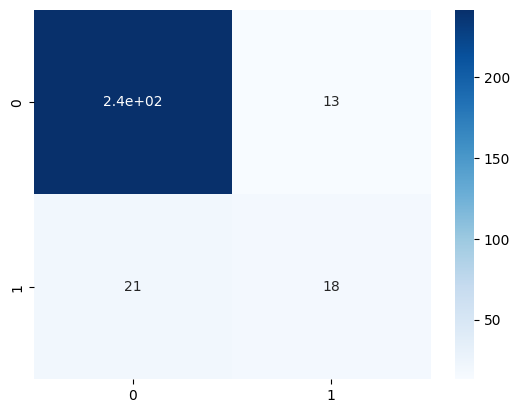

In [93]:
sns.heatmap(data=confusion_matrix(y_test, lr_pred),annot=True, cmap='Blues')

Text(0.5, 1.0, 'ROC CURVE')

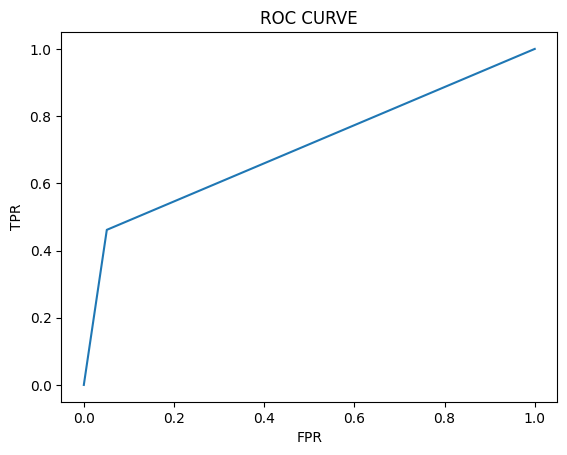

In [94]:
fpr, tpr, _ = roc_curve(y_test, lr_pred)
plt.plot(fpr, tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [105]:
lr_train_pred = lr.predict(X_train)
print(accuracy_score(y_train, lr_train_pred))

0.8903061224489796


<h3>We will now test KNN model</h3>

In [95]:
from sklearn.neighbors import KNeighborsClassifier

In [96]:
knn = KNeighborsClassifier(n_neighbors=5)

In [97]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [98]:
knn_pred = knn.predict(X_test)
knn_pred

array([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [99]:
print(classification_report(y_test, knn_pred))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93       255
           1       0.53      0.21      0.30        39

    accuracy                           0.87       294
   macro avg       0.71      0.59      0.61       294
weighted avg       0.84      0.87      0.84       294



In [100]:
print(accuracy_score(y_test, knn_pred))

0.8707482993197279


In [101]:
print(confusion_matrix(y_test, knn_pred))

[[248   7]
 [ 31   8]]


<Axes: >

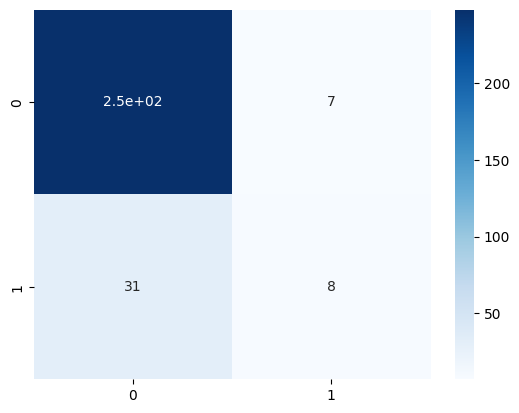

In [102]:
sns.heatmap(confusion_matrix(y_test, knn_pred), annot=True, cmap='Blues')

In [103]:
print(roc_auc_score(y_test, knn_pred))

0.588838612368024


Text(0.5, 1.0, 'ROC CURVE')

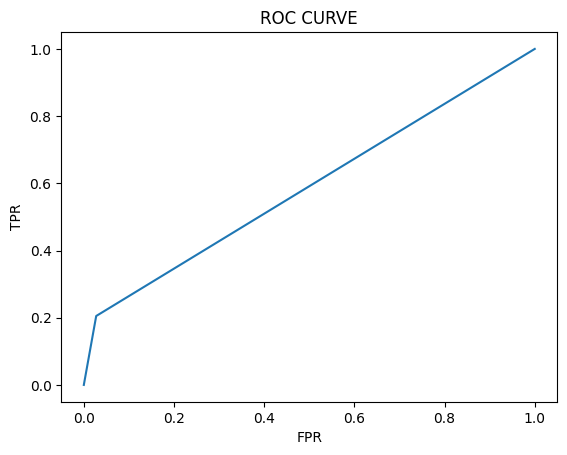

In [104]:
fpr, tpr, _ = roc_curve(y_test, knn_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [106]:
knn_train_pred = knn.predict(X_train)
print(f'The training score is {accuracy_score(y_train, knn_train_pred)}')

The training score is 0.8571428571428571


<p style="font-size:120%; color:#FA8128">We get to know that our model are not overfitting the data but it is also clear that we should be able to
train our model on both classes. At the moment our dataset is imbalanced which will lead to low roc_auc_score 
and higher accuracy can be misleading sometimes.So, we will build a model on oversampled dataset as well.</h3>

In [108]:
from sklearn.svm import SVC

In [109]:
svc = SVC()

In [110]:
svc.fit(X_train, y_train)

SVC()

In [111]:
svc_pred = svc.predict(X_test)
svc_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [112]:
print(classification_report(y_test, svc_pred))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94       255
           1       0.90      0.23      0.37        39

    accuracy                           0.89       294
   macro avg       0.90      0.61      0.65       294
weighted avg       0.90      0.89      0.87       294



In [113]:
print(confusion_matrix(y_test, svc_pred))

[[254   1]
 [ 30   9]]


In [114]:
print(accuracy_score(y_test, svc_pred))

0.8945578231292517


In [115]:
roc_auc_score(y_test, svc_pred)

0.6134238310708899

Text(0.5, 1.0, 'ROC CURVE')

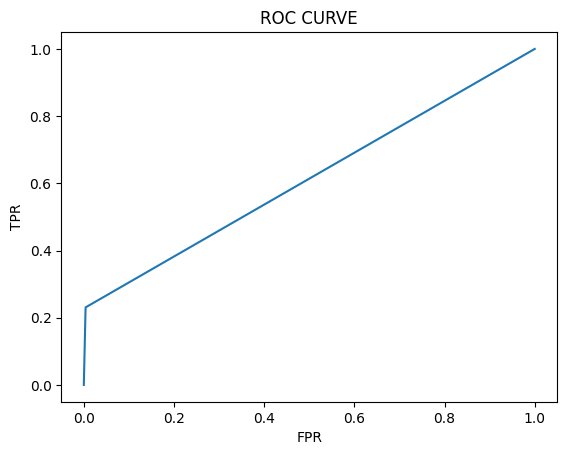

In [116]:
fpr, tpr, _ = roc_curve(y_test, svc_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [117]:
svc_train_pred = svc.predict(X_train)
print(accuracy_score(y_train, svc_train_pred))

0.9200680272108843


<p style="font-size:120%;color:purple">You can see that we are getting 88% accuracy which is really good however since this is an imbalanced dataset you can see that we are not getting the desired curve as our model is learning less about attrition yes and to better our accuracy and our model should learn about both classes we have to do sampling of data.
Here we will use oversampling technique 'Synthetic Minority Over Sampling Technique' SMOTE<p>

<p style="font-size:120%;color:maroon">We will keep the testing dataset as it is and we will do oversampling on training dataset which is stored in the X_train_original variable dataframe</p>

In [118]:
X_train_original

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
1097,24,350,21,2,1,1551,3,57,2,1,...,1,0,0,0,0,0,0,0,0,0
727,18,287,5,2,1,1012,2,73,3,1,...,0,0,0,0,1,0,0,0,1,0
254,29,1247,20,2,1,349,4,45,3,2,...,0,0,0,0,0,1,0,0,0,0
1175,39,492,12,3,1,1654,4,66,3,2,...,0,0,1,0,0,0,0,1,0,0
1341,31,311,20,3,1,1881,2,89,3,2,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,35,750,28,3,1,1596,2,46,4,2,...,1,0,0,0,0,0,0,1,0,0
1294,41,447,5,3,1,1814,2,85,4,2,...,0,0,0,0,0,0,0,0,1,0
860,22,1256,3,4,1,1203,3,48,2,1,...,0,0,0,0,1,0,0,1,0,1
1459,29,1378,13,2,1,2053,4,46,2,2,...,1,0,0,0,0,0,0,1,0,1


In [119]:
y_train_original = y_train.copy()

In [120]:
y_train_original

1097    0
727     0
254     0
1175    0
1341    0
       ..
1130    0
1294    0
860     1
1459    0
1126    0
Name: Attrition, Length: 1176, dtype: int64

In [121]:
from imblearn.over_sampling import SMOTE

In [122]:
smote = SMOTE()

In [123]:
X_train, y_train = smote.fit_resample(X_train_original, y_train_original)

In [124]:
X_train

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,24,350,21,2,1,1551,3,57,2,1,...,1,0,0,0,0,0,0,0,0,0
1,18,287,5,2,1,1012,2,73,3,1,...,0,0,0,0,1,0,0,0,1,0
2,29,1247,20,2,1,349,4,45,3,2,...,0,0,0,0,0,1,0,0,0,0
3,39,492,12,3,1,1654,4,66,3,2,...,0,0,1,0,0,0,0,1,0,0
4,31,311,20,3,1,1881,2,89,3,2,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1951,36,751,12,4,1,919,1,71,1,1,...,1,0,0,0,0,0,0,0,0,1
1952,33,621,12,3,1,998,2,38,2,1,...,0,0,0,0,0,0,0,0,0,1
1953,25,1264,5,2,1,677,3,67,3,1,...,1,0,0,0,0,0,0,0,0,1
1954,38,590,2,3,1,1458,1,54,2,1,...,1,0,0,0,0,0,0,0,1,1


In [125]:
X_train.shape

(1956, 47)

In [126]:
X_test

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,-0.953774,0.164193,-0.522699,0.099933,0.0,0.725651,1.198515,0.847140,0.389912,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,1.905235,-0.260998,-0.937334,1.508564,-0.636410
1,1.763636,0.701729,0.458849,-0.863356,0.0,-1.281462,1.198515,-0.472832,1.792164,-0.025447,...,-0.458123,-0.268355,3.160800,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
2,-1.388559,-1.379372,1.563090,-1.826644,0.0,1.129050,1.198515,-0.423944,-2.414593,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,-0.636410
3,0.894065,1.330497,-0.277312,0.099933,0.0,-1.551492,-0.639104,-0.375056,0.389912,0.881380,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
4,-0.084203,1.471045,-0.522699,-0.863356,0.0,-1.192550,1.198515,-0.228393,0.389912,-0.025447,...,2.182821,-0.268355,-0.316376,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,1.508564,-0.636410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,-0.301596,-1.221563,-0.890780,0.099933,0.0,-0.398925,1.198515,-0.326169,0.389912,-0.025447,...,-0.458123,-0.268355,-0.316376,-0.247733,-0.509019,1.905235,-0.260998,-0.937334,1.508564,-0.636410
290,-0.301596,-1.559372,-0.154619,2.026510,0.0,-0.417037,-0.639104,-1.695029,0.389912,-0.025447,...,-0.458123,-0.268355,3.160800,-0.247733,-0.509019,-0.524870,-0.260998,-0.937334,-0.662882,-0.636410
291,1.437547,1.288579,2.299251,0.099933,0.0,0.475379,1.198515,-1.157262,0.389912,1.788207,...,-0.458123,-0.268355,-0.316376,4.036597,-0.509019,-0.524870,-0.260998,1.066856,-0.662882,1.571314
292,0.024494,1.049401,0.090768,-0.863356,0.0,-0.515828,1.198515,0.651589,1.792164,-0.932274,...,-0.458123,-0.268355,-0.316376,-0.247733,1.964562,-0.524870,-0.260998,-0.937334,1.508564,-0.636410


In [127]:
X_test.shape

(294, 47)

In [128]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
1951    1
1952    1
1953    1
1954    1
1955    1
Name: Attrition, Length: 1956, dtype: int64

In [129]:
y_train.shape

(1956,)

In [130]:
y_test

1041    0
184     0
1222    1
67      0
220     0
       ..
567     0
560     0
945     0
522     0
651     0
Name: Attrition, Length: 294, dtype: int64

In [131]:
y_test.shape

(294,)

<h4>We have to scale the training data</h4>

In [132]:
scaler = StandardScaler()

In [133]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,-1.242716,-1.123806,1.463576,-0.751718,0.0,0.924090,0.495116,-0.528165,-0.729583,-0.759430,...,2.451684,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,-0.628609,-0.658002
1,-1.912621,-1.288281,-0.600973,-0.751718,0.0,-0.013963,-0.459960,0.323561,0.638648,-0.759430,...,-0.407883,-0.21183,-0.241747,-0.189781,2.363442,-0.467645,-0.225938,-0.717708,1.590813,-0.658002
2,-0.684461,1.218014,1.334542,-0.751718,0.0,-1.167821,1.450192,-1.166960,0.638648,0.218480,...,-0.407883,-0.21183,-0.241747,-0.189781,-0.423112,2.138375,-0.225938,-0.717708,-0.628609,-0.658002
3,0.432048,-0.753083,0.302268,0.263023,0.0,1.103347,1.450192,-0.049069,0.638648,0.218480,...,-0.407883,-0.21183,4.136558,-0.189781,-0.423112,-0.467645,-0.225938,1.393325,-0.628609,-0.658002
4,-0.461159,-1.225624,1.334542,0.263023,0.0,1.498409,-0.459960,1.175288,0.638648,0.218480,...,2.451684,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,-0.628609,-0.658002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1951,0.097095,-0.076906,0.302268,1.277764,0.0,-0.175816,-1.415036,0.217096,-2.097815,-0.759430,...,2.451684,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,-0.628609,1.519752
1952,-0.237858,-0.416300,0.302268,0.263023,0.0,-0.038328,-0.459960,-1.539591,-0.729583,-0.759430,...,-0.407883,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,-0.628609,1.519752
1953,-1.131065,1.262396,-0.600973,-0.751718,0.0,-0.596983,0.495116,0.004164,0.638648,-0.759430,...,2.451684,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,-0.628609,1.519752
1954,0.320397,-0.497232,-0.988076,0.263023,0.0,0.762237,-1.415036,-0.687864,-0.729583,-0.759430,...,2.451684,-0.21183,-0.241747,-0.189781,-0.423112,-0.467645,-0.225938,-0.717708,1.590813,1.519752


In [134]:
lr = LogisticRegression()

In [135]:
lr.fit(X_train, y_train)

LogisticRegression()

In [136]:
lr_pred = lr.predict(X_test)

In [137]:
lr_pred

array([1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 1])

In [138]:
print(classification_report(y_test, lr_pred))

              precision    recall  f1-score   support

           0       0.95      0.42      0.59       255
           1       0.18      0.85      0.30        39

    accuracy                           0.48       294
   macro avg       0.57      0.63      0.44       294
weighted avg       0.85      0.48      0.55       294



In [139]:
print(confusion_matrix(y_test, lr_pred))

[[108 147]
 [  6  33]]


In [140]:
accuracy_score(y_test, lr_pred)

0.47959183673469385

In [141]:
roc_auc_score(y_test, lr_pred)

0.634841628959276

<Axes: >

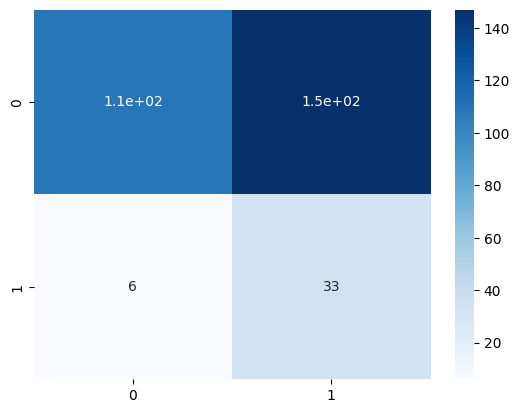

In [142]:
sns.heatmap(data=confusion_matrix(y_test, lr_pred), annot=True, cmap='Blues')

In [144]:
lr_train_pred = lr.predict(X_train)
print(accuracy_score(y_train, lr_train_pred))

0.9084867075664622


In [145]:
fpr, tpr, _ = roc_curve(y_test, lr_pred)

Text(0.5, 1.0, 'ROC CURVE')

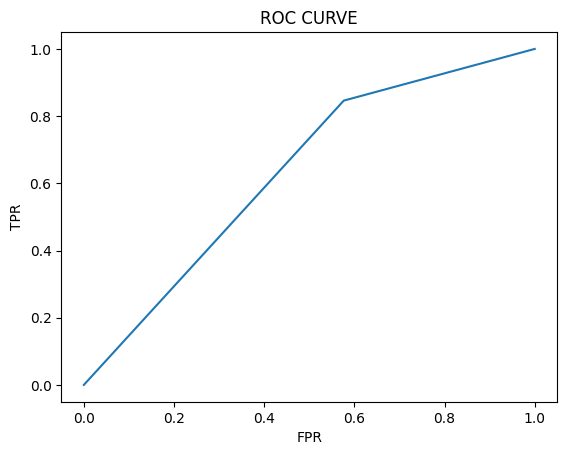

In [146]:
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [147]:
from sklearn.tree import DecisionTreeClassifier

In [148]:
dtc = DecisionTreeClassifier()

In [149]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [150]:
dtc_pred = dtc.predict(X_test)
dtc_pred

array([0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0])

In [151]:
print(classification_report(y_test, dtc_pred))

              precision    recall  f1-score   support

           0       0.90      0.81      0.85       255
           1       0.26      0.44      0.32        39

    accuracy                           0.76       294
   macro avg       0.58      0.62      0.59       294
weighted avg       0.82      0.76      0.78       294



In [152]:
print(confusion_matrix(y_test, dtc_pred))

[[206  49]
 [ 22  17]]


In [153]:
accuracy_score(y_test, dtc_pred)

0.7585034013605442

In [154]:
roc_auc_score(y_test, dtc_pred)

0.6218702865761689

Text(0.5, 1.0, 'ROC CURVE')

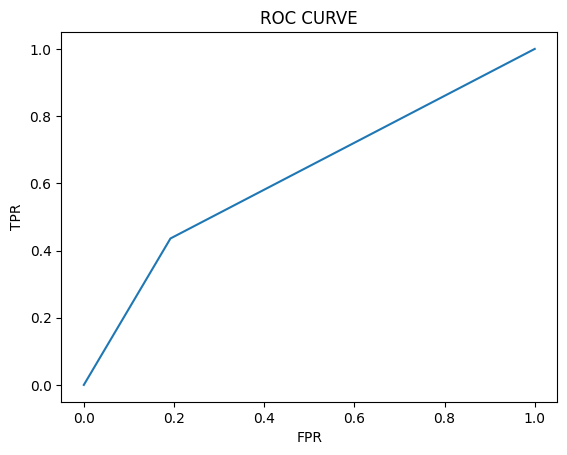

In [155]:
fpr, tpr, _ = roc_curve(y_test, dtc_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [156]:
from sklearn.ensemble import RandomForestClassifier

In [157]:
RFC = RandomForestClassifier()

In [158]:
RFC.fit(X_train, y_train)

RandomForestClassifier()

In [159]:
RFC_PRED = RFC.predict(X_test)
RFC_PRED

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0])

In [160]:
print(classification_report(y_test, RFC_PRED))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       255
           1       0.41      0.36      0.38        39

    accuracy                           0.85       294
   macro avg       0.66      0.64      0.65       294
weighted avg       0.84      0.85      0.84       294



In [161]:
print(confusion_matrix(y_test, RFC_PRED))

[[235  20]
 [ 25  14]]


In [162]:
accuracy_score(y_test, RFC_PRED)

0.8469387755102041

In [163]:
roc_auc_score(y_test, RFC_PRED)

0.6402714932126697

Text(0.5, 1.0, 'ROC CURVE')

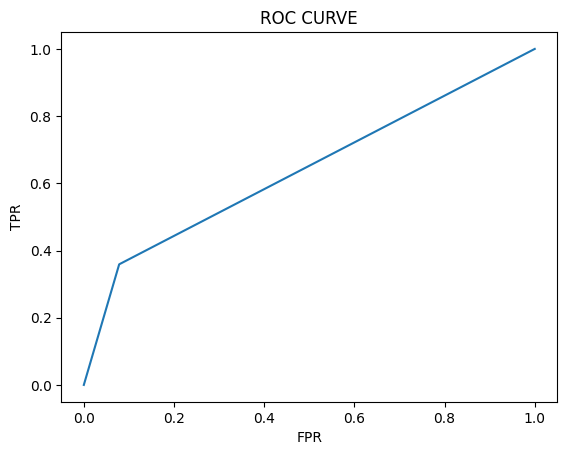

In [164]:
fpr, tpr, _ = roc_curve(y_test, RFC_PRED)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [165]:
from sklearn.ensemble import GradientBoostingClassifier

In [166]:
gbc = GradientBoostingClassifier()

In [167]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [168]:
gbc_pred = gbc.predict(X_test)
gbc_pred

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0])

In [169]:
print(accuracy_score(y_test, gbc_pred))

0.8435374149659864


In [170]:
print(roc_auc_score(y_test, gbc_pred))

0.7034690799396682


Text(0.5, 1.0, 'ROC CURVE')

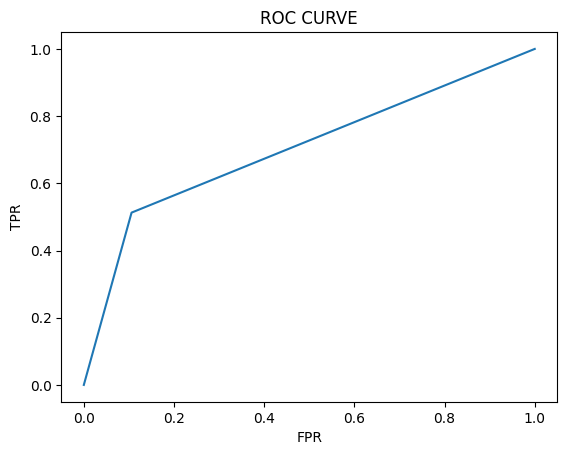

In [171]:
fpr, tpr, _ = roc_curve(y_test, gbc_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [172]:
from xgboost import XGBRFClassifier

In [173]:
xgb = XGBRFClassifier()

In [174]:
xgb.fit(X_train, y_train)

XGBRFClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bytree=None, device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, gamma=None,
                grow_policy=None, importance_type=None,
                interaction_constraints=None, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=None, n_jobs=None,
                num_parallel_tree=None, objective='binary:logistic',
                random_state=None, reg_alpha=None, ...)

In [175]:
xgb_pred=xgb.predict(X_test)
xgb_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

In [176]:
print(classification_report(y_test, xgb_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       255
           1       0.13      1.00      0.23        39

    accuracy                           0.13       294
   macro avg       0.07      0.50      0.12       294
weighted avg       0.02      0.13      0.03       294



<p style="font-size:130%;color:purple">We can see that using oversampling technique leads to certain model learn about both classes and there is an increase in ROC_AUC_SCORE EVEN THOUGH WE HAVE TO SACRIFICE AROUND 10% ACCURACY BUT IT WILL BE A BETTER MODEL</p>

In [178]:
from sklearn.svm import SVC

In [179]:
svc = SVC()

In [180]:
svc.fit(X_train, y_train)

SVC()

In [181]:
svc_pred = svc.predict(X_test)
svc_pred

array([0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0])

In [204]:
print(classification_report(y_test, svc_pred))

              precision    recall  f1-score   support

           0       0.94      0.75      0.83       255
           1       0.30      0.69      0.42        39

    accuracy                           0.74       294
   macro avg       0.62      0.72      0.62       294
weighted avg       0.86      0.74      0.78       294



In [205]:
confusion_matrix(y_test, svc_pred)

array([[191,  64],
       [ 12,  27]])

<Axes: >

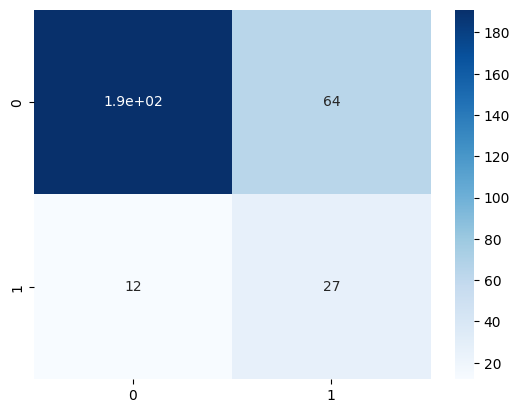

In [206]:
sns.heatmap(confusion_matrix(y_test, svc_pred), annot=True, cmap='Blues')

In [207]:
from sklearn.metrics import f1_score

In [208]:
f1_score(y_test, svc_pred)

0.4153846153846154

In [182]:
accuracy_score(y_test, svc_pred)

0.7414965986394558

In [183]:
roc_auc_score(y_test, svc_pred)

0.7206636500754148

Text(0.5, 1.0, 'ROC CURVE')

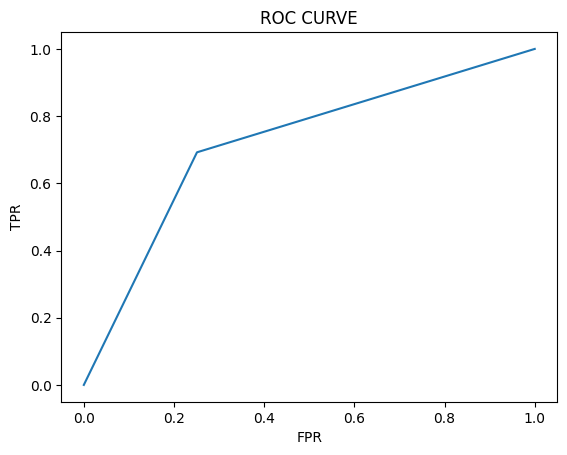

In [184]:
fpr, tpr, _ = roc_curve(y_test, svc_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

In [185]:
svc_train_pred = svc.predict(X_train)
print(accuracy_score(y_train, svc_train_pred))

0.9585889570552147


In [186]:
#Our svc model is also not leading to overfitting or underfitting

<p style="font-size:120%;color:royalblue">We tried and tested various machine learning models on both normal dataset and oversampling dataset and the best performing model on both these datasets is Support Vector Machine model</p>

<p style="font-size:120%;color:darkgreen">Now, we are in a difficult situation beacuse we have to choose whether we want to prioritize accuracy score or roc_auc_score. If we choose accuracy score or imbalanced dataset we will get good accuracy around 88% and roc_auc_score of 0.70 but our model will not learn about both classes. On the other hand, if we choose oversampling dataset, we will get a accuracy score of around 74% which is less than imbalanced dataset accuracy score but our model will learn more as shown above with roc_auc_score of around 0.72</p>

<p style="font-size:120%;color:maroon">We will chosse oversampling dataset and SVM model</p>

<h3>HYPERPARAMTER TUNING</h3>

In [187]:
from sklearn.model_selection import RandomizedSearchCV

In [188]:
param_grid = {
    'C': [0.1, 1, 10, 100],  
    'gamma': [1, 0.1, 0.01, 0.001],  
    'kernel': ['rbf', 'linear']
}

In [189]:
randomizedsearchcv = RandomizedSearchCV(SVC(), param_grid,scoring='accuracy', cv=5,n_jobs=-1, verbose=4)

In [190]:
randomizedsearchcv.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100],
                                        'gamma': [1, 0.1, 0.01, 0.001],
                                        'kernel': ['rbf', 'linear']},
                   scoring='accuracy', verbose=4)

In [191]:
randomizedsearchcv.best_score_

0.8989482749621587

In [192]:
randomizedsearchcv.best_params_

{'kernel': 'rbf', 'gamma': 0.1, 'C': 100}

In [193]:
svc1=SVC(C=100, gamma=0.1, kernel='rbf')
svc1

SVC(C=100, gamma=0.1)

In [194]:
svc1.fit(X_train, y_train)

SVC(C=100, gamma=0.1)

In [195]:
svc1_pred = svc.predict(X_test)
svc1_pred

array([0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0])

In [196]:
accuracy_score(y_test, svc1_pred)

0.7414965986394558

In [197]:
print(classification_report(y_test, svc_pred))

              precision    recall  f1-score   support

           0       0.94      0.75      0.83       255
           1       0.30      0.69      0.42        39

    accuracy                           0.74       294
   macro avg       0.62      0.72      0.62       294
weighted avg       0.86      0.74      0.78       294



In [198]:
confusion_matrix(y_test, svc1_pred)

array([[191,  64],
       [ 12,  27]])

In [199]:
roc_auc_score(y_test, svc1_pred)

0.7206636500754148

Text(0.5, 1.0, 'ROC CURVE')

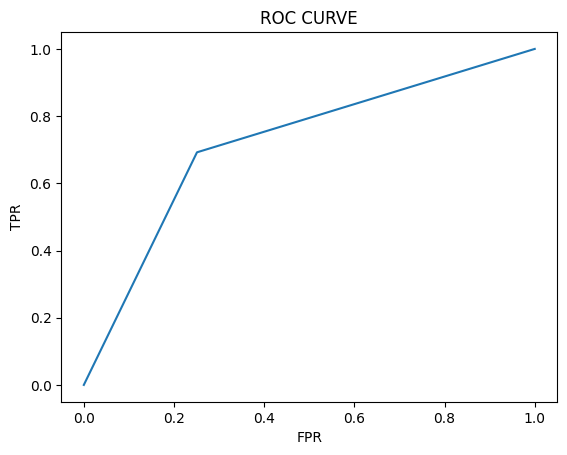

In [200]:
fpr, tpr, _ = roc_curve(y_test, svc1_pred)
plt.plot(fpr,tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<p style="font-size:130%;color:maroon">You can see that even after hyperparamter tuning our model is not improving at all so, we will use the normal SVM classifier model</p>

<H2>SAVING THE MODEL</H2>

In [201]:
import pickle

In [202]:
with open('HR_ANALYTICS_MODEL.pkl', 'wb') as file:
    pickle.dump(svc, file)

In [203]:
#We have saved the model

[CV 1/5] END ......C=10, gamma=1, kernel=linear;, score=0.551 total time=   0.4s
[CV 3/5] END .....C=1, gamma=0.1, kernel=linear;, score=0.923 total time=   0.4s
[CV 4/5] END ........C=1, gamma=0.1, kernel=rbf;, score=0.982 total time=   0.4s
[CV 2/5] END .....C=10, gamma=0.001, kernel=rbf;, score=0.941 total time=   0.2s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.675 total time=   0.4s
[CV 3/5] END ........C=1, gamma=0.1, kernel=rbf;, score=0.974 total time=   0.4s
[CV 4/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.946 total time=   0.2s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.693 total time=   0.4s
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.969 total time=   0.2s
[CV 5/5] END .....C=10, gamma=0.001, kernel=rbf;, score=0.964 total time=   0.2s
[CV 3/5] END ..C=0.1, gamma=0.01, kernel=linear;, score=0.928 total time=   0.2s
[CV 2/5] END .....C=1, gamma=0.1, kernel=linear;, score=0.941 total time=   0.5s
[CV 5/5] END ........C=1, ga

<h1 style="color:#00308F">DOCUMENTATION</h1>

<p style="font-size:140%;color:	#F81894">We trained and tested various machine learning models like Logistic Regression, Random Forest, SVM, Gradient Boosting, etc but the best model which learned about both the target class was SVM. Other models learned very well on imbalanced data and gave better accuracy but didn't learn about other class very well. So, we did apply oversampling technique SMOTE and SVM MODEL gave balanced accuracy and ROC_AUC_SCORE. The model didn't have any overfitting and underfitting issue as well.</p>
<hr>

<P>WE SAVED THE SVM MODEL IN A PICKLE FILE FOR FUTHER USE</P>

<p style="font-size:130%;color:	#58111A">SVM MODEL METRICS ⬇️</p>
<br>
<p style="font-size:130%;color:	#F400A1">ACCURACY SCORE: 0.74</p>
<p style="font-size:130%;color:	#F400A1">ROC AUC SCORE : 0.72</p>
<p style="font-size:130%;color:	#F400A1">F1 SCORE: 0.41</p>

<h3>Some other metrics image</h3>

In [211]:
from IPython.display import Image

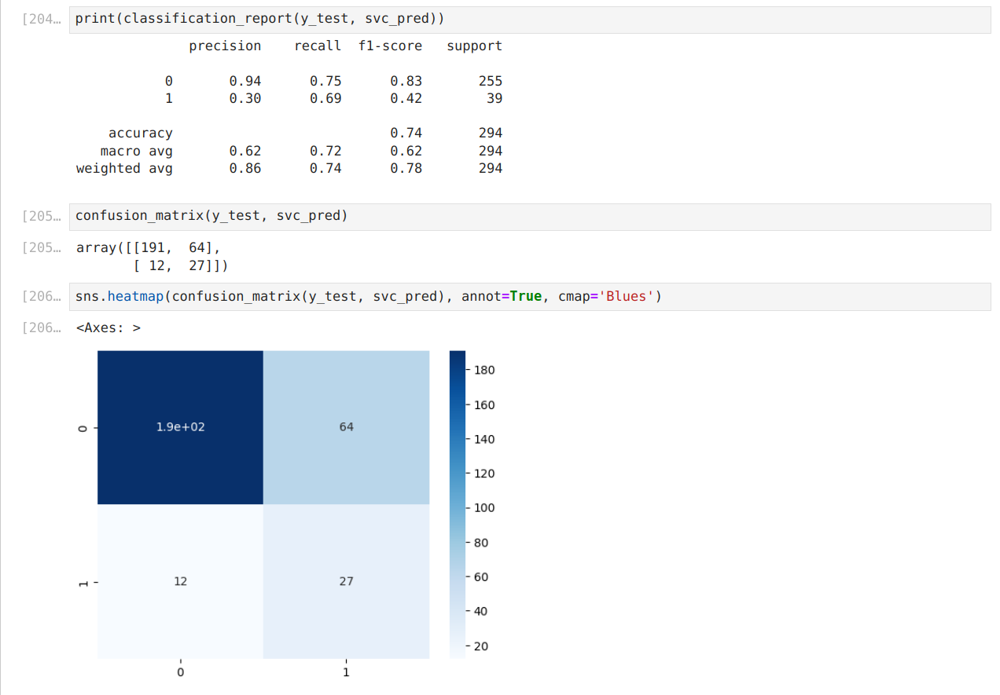

In [212]:
Image(filename='Screenshot_20240705_120715.png')

<h1>THANK YOU</h1>